In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import glob
import os, re

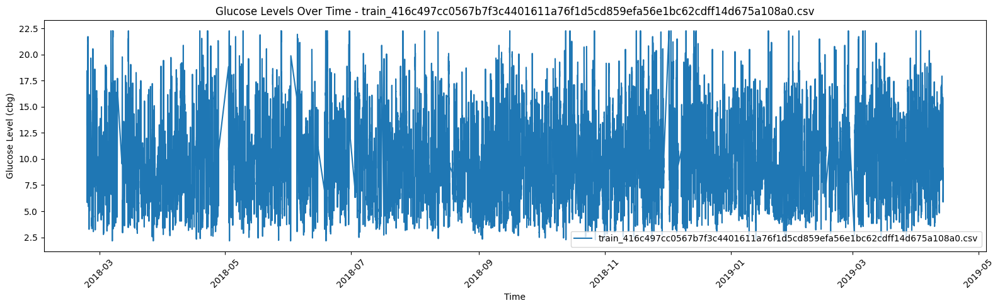

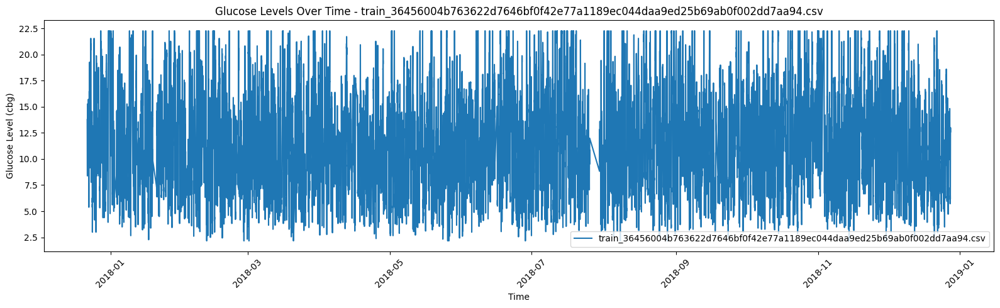

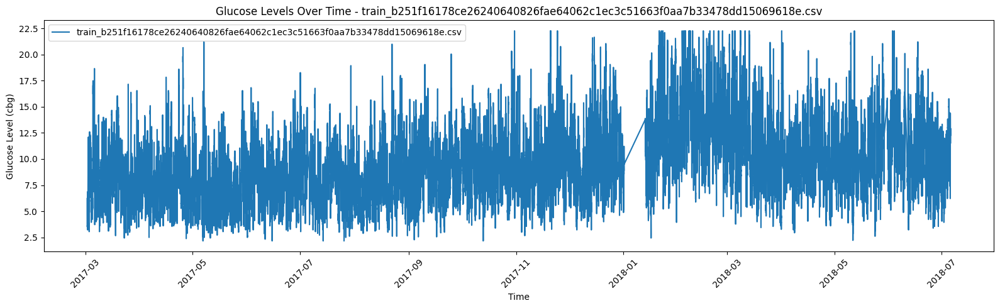

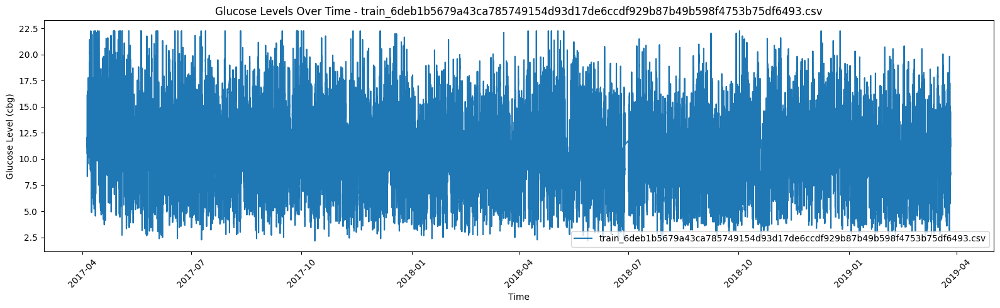

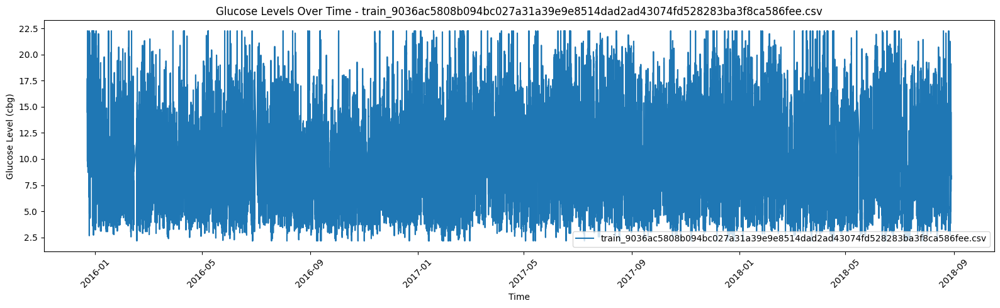

...

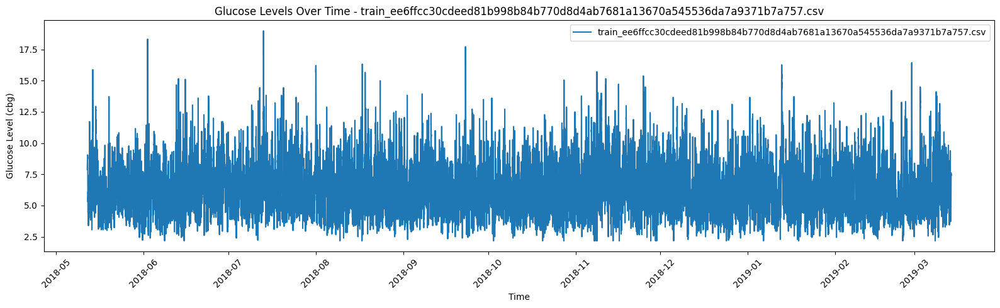

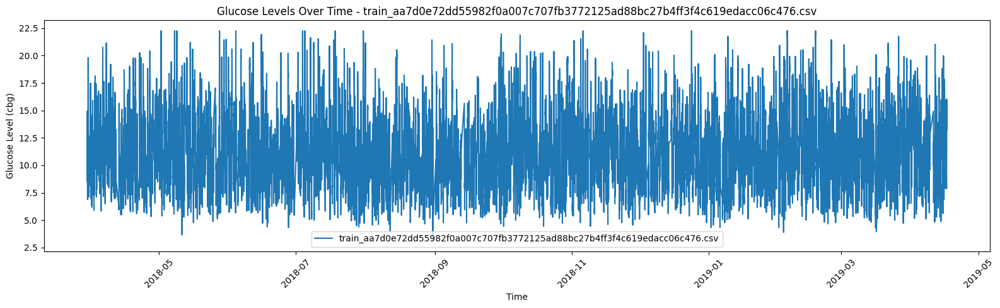

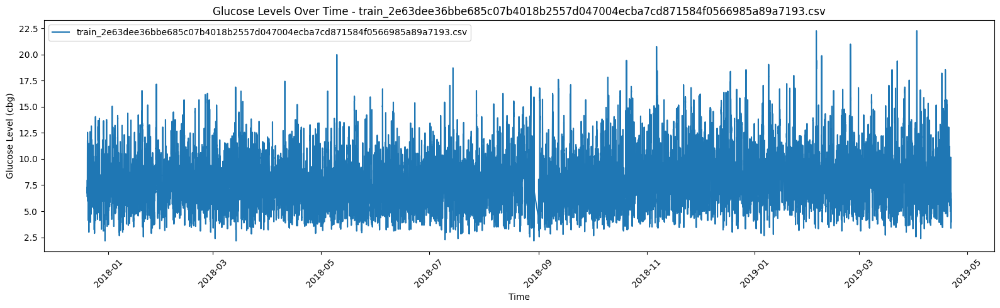

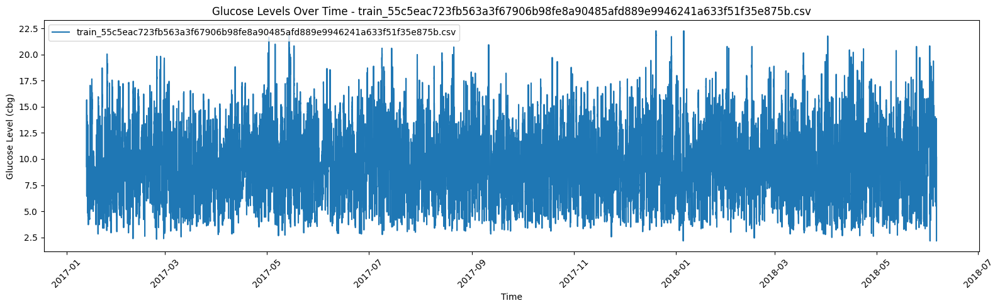

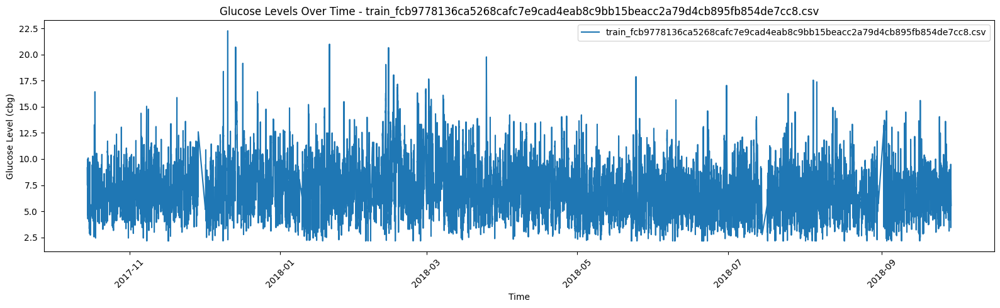

In [2]:
# Path to the folder containing the CSV files
folder_path = 'Tidepool_Datasets/Tidepool-JDRF-SAP100-train/train-data' 

# Use glob to get all CSV files in the folder
csv_files = glob.glob(os.path.join(folder_path, '*.csv'))

# Compile the regular expression pattern for the desired filenames
pattern = re.compile(r'train_[a-f0-9]+.csv')

# Filter files that match the pattern
filtered_files = [file for file in csv_files if pattern.search(os.path.basename(file))]

# Check if any files were found
if not filtered_files:
    print("No files matching the pattern were found.")
else:
    # Loop through each file and plot the glucose levels
    for file in filtered_files:
        # Read the CSV file
        data = pd.read_csv(file, low_memory=False)
        
        # Filter the data where 'type' is 'cbg'
        cbg_data = data[data['type'] == 'cbg']

        # Ensure the 'time' column is in datetime format
        cbg_data.loc[:, 'time'] = pd.to_datetime(cbg_data['time'], format='ISO8601', errors='coerce')

        # Plot the 'value' (glucose level) vs 'time'
        plt.figure(figsize=(16, 5))
        plt.plot(cbg_data['time'], cbg_data['value'], label=os.path.basename(file))
        
        # Add labels and title
        plt.xlabel('Time')
        plt.ylabel('Glucose Level (cbg)')
        plt.title(f'Glucose Levels Over Time - {os.path.basename(file)}')
        
        # Rotate the x-axis labels for better readability
        plt.xticks(rotation=45)
        
        # Show the legend
        plt.legend()
        
        # Display the plot
        plt.tight_layout()
        plt.show()